In [1]:
import glob
import cv2 
import os
import keras
import numpy as np
import imutils
import matplotlib.pyplot as plt
from skimage.measure import compare_ssim as ssim
from random import shuffle

from keras import layers
from keras.callbacks import TensorBoard
from keras.layers import Input, Conv2D, MaxPooling2D, MaxPooling1D, UpSampling2D, UpSampling1D, Conv2DTranspose 
from keras.layers import Flatten, GRU, Conv1D, Reshape, Concatenate, concatenate
from keras.models import Model
from keras.optimizers import Adam
from keras.utils import plot_model

Using TensorFlow backend.


In [0]:
# Cropping out images to get only clear images of brain 
def crop_images(img):
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)                             # Conversion to grayscale
    gray = cv2.GaussianBlur(gray_img, (5, 5), 0)                                 # Blurring it

    thresh_img = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]              # Thresholding 
    eroded = cv2.erode(thresh_img, None, iterations=2)                           # Erosion 
    dilated = cv2.dilate(eroded, None, iterations=2)                             # Dilation to remove small regions of noise

    contours = cv2.findContours(dilated.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE) # Finding Contours
    contours = imutils.grab_contours(contours)                                   
    contour_area = max(contours, key=cv2.contourArea)                            # Taking the largest area

    extreme_left = tuple(contour_area[contour_area[:, :, 0].argmin()][0])        # Finding extreme points in area
    extreme_right = tuple(contour_area[contour_area[:, :, 0].argmax()][0])
    extreme_top = tuple(contour_area[contour_area[:, :, 1].argmin()][0])
    extreme_bottom = tuple(contour_area[contour_area[:, :, 1].argmax()][0])

    new_img = img[extreme_top[1]:extreme_bottom[1], extreme_left[0]:extreme_right[0]].copy() # Cropping Image according to extreme points
    return new_img

In [0]:
#Input
def load_dataset_train():
  path_train = glob.glob("/content/sample_data/train/*")                         # Folder from which train data has been accessed
  X_train = []
  shuffle(path_train)                                                            # Shuffling Images
  for img in path_train:
    n = cv2.imread(img)                                                          # Reading Image
    n_img=crop_images(n)                                                         # Cropping Image
    X_train.append(n_img)
  return np.array(X_train)                                                       # Returning array of train images

def load_dataset_test():
  path_test = glob.glob("/content/sample_data/test/*")                           # Folder from which test data has been accessed
  X_test = []
  shuffle(path_test)                                                             # Shuffling Images
  for img in path_test:
    n = cv2.imread(img)                                                          # Reading Image
    n_img=crop_images(n)                                                         # Cropping Image
    X_test.append(n_img)
  return np.array(X_test)                                                        # Returning array of test images

In [0]:
# Preprocessing Images
def preprocess_images(input_images, img_size):                                   
    new_images = []
    for img in input_images:
        img = cv2.resize(img,dsize=img_size,interpolation=cv2.INTER_CUBIC)       # Resizing image according to given shape
        img=img.astype('float32') / 255                                          # Normalizing Image
        new_images.append(img)
    return np.array(new_images)                                                  # Returning array of processed images

(256, 256, 3)


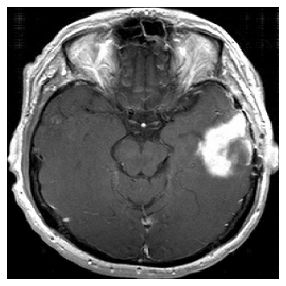

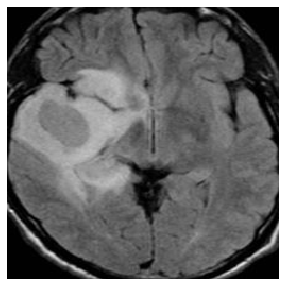

In [5]:
# Loading Datasets 
X_train_load=load_dataset_train()
X_test_load=load_dataset_test()

# Preprocessing Images
X_train=preprocess_images(X_train_load,(256,256))
X_test=preprocess_images(X_test_load,(256,256))

# Plotting Train Image 
plt.figure(figsize=(5,5))
plt.axis('off')
plt.imshow(X_train[0])
print(X_train[0].shape)

# Plotting Test Image
plt.figure(figsize=(5,5))
plt.axis('off')
plt.imshow(X_test[0])

In [0]:
def add_noise(input_images):
  new_images=[]
  for img in input_images:
    img1 = img.copy()                                                            # Copying image
    rows,cols = img1.shape[0],img1.shape[1]
    img1= img1+ 0.1 * np.random.normal(loc=0.0, scale=1.0, size=img1.shape)      # Adding 10% noise to image using random
    new_images.append(img1)
  return new_images                                                              # Returning list of noisy images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


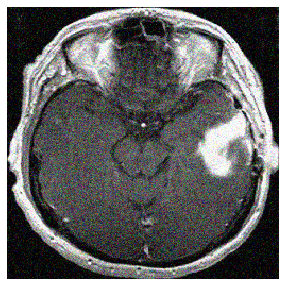

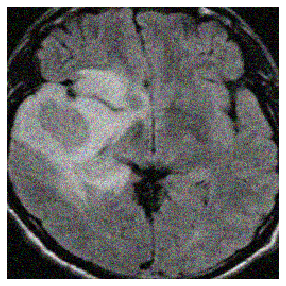

In [7]:
# Adding Noise to train and test dataset images
X_train_noise=add_noise(X_train)
X_test_noise=add_noise(X_test)
X_test_noisy=np.array(X_test_noise)

# Reducing dimension for Input layer
x_train=np.squeeze(X_train)
X_train_noisy=np.squeeze(X_train_noise)

# Plotting Noisy train image
plt.figure(figsize=(5,5))
plt.axis('off')
plt.imshow(X_train_noise[0])

# Plotting Noisy test image
plt.figure(figsize=(5,5))
plt.axis('off')
plt.imshow(X_test_noise[0])

In [0]:
!rm -rf /tmp/A_Loss 







Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 256, 256, 3)       84        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 128, 128, 3)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 128, 128, 3)       84        
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 64, 64, 3)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 64, 64, 3)         84        
_________________________________________________________________
up_sampling2d_1 (UpSampling2 (None, 128, 128, 3)     

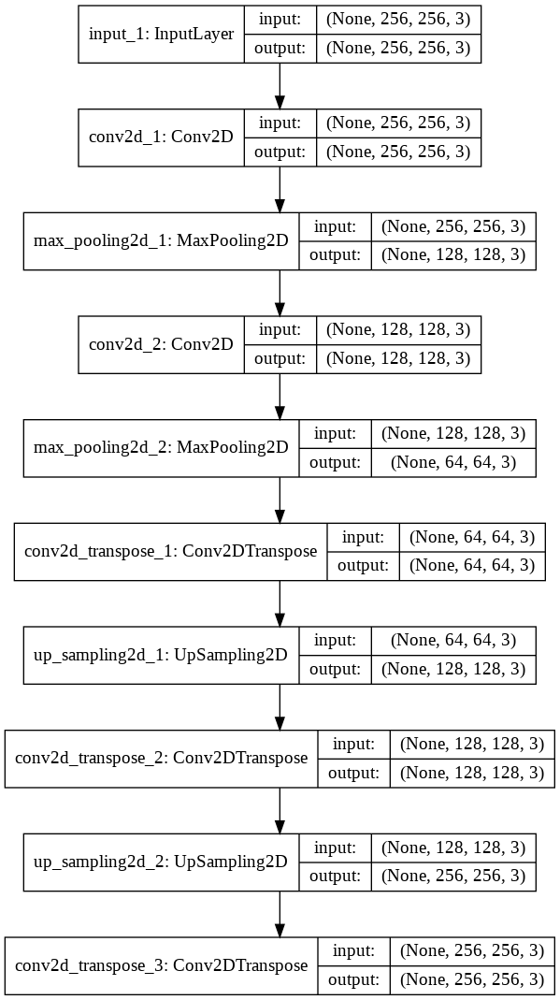

In [9]:
# Auto-Encoder
input_img = Input(shape=(256, 256,3))                                            # Input Layer 
x = Conv2D(3, (3, 3), activation='relu', padding='same',strides=1)(input_img)    # Convolutional layer in encoder
x = MaxPooling2D((2, 2), padding='same')(x)                                      # Maxpooling layer in encoder
x = Conv2D(3, (3, 3), activation='relu', padding='same',strides=1)(x)            # Convolutional layer in encoder
encoded = MaxPooling2D((2, 2), padding='same')(x)                                # Maxpooling layer. This is the output of Encoder.

x = Conv2DTranspose(3, (3, 3), activation='relu', padding='same',strides=1)(encoded) # Output of Encoder given as Input to Decoder. 
x = UpSampling2D((2, 2))(x)                                                      # UpSampling layer in decoder                                                 
x = Conv2DTranspose(3, (3, 3), activation='relu', padding='same',strides=1)(x)   # Convolutional Transpose layer in decoder
x = UpSampling2D((2, 2))(x)                                                      # UpSampling layer in decoder              
decoded = Conv2DTranspose(3, (3, 3), activation='sigmoid', padding='same',strides=1)(x) # Output of Decoder Layer

auto_encoder = Model(input_img, decoded)                                         # Defining AutoEncoder Model
auto_encoder.compile(optimizer=Adam(), loss='mean_squared_error')                # Compiling Model with Adam optimizer and mean squared error as loss function
auto_encoder.summary()                                                           # Architecture of Model 
plot_model(auto_encoder,show_shapes=True)                                        # Plotting graph of Architecture

In [10]:
A3 = TensorBoard(log_dir='/tmp/A_Loss',histogram_freq=0,write_graph=True,write_grads=True) # Tensorboard object
A3.set_model(auto_encoder)                                                       # Setting Model for tensorboard object 'A3'
auto_encoder.fit(X_train_noisy,x_train,verbose=0,epochs=1000,shuffle=True,callbacks=[A3])    # Fitting or Training the model

In [12]:
%reload_ext tensorboard                                                          
%tensorboard --logdir /tmp/A_Loss                                                

Reusing TensorBoard on port 6006 (pid 551), started 0:00:05 ago. (Use '!kill 551' to kill it.)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


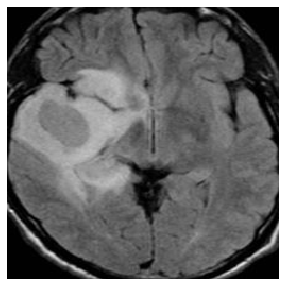

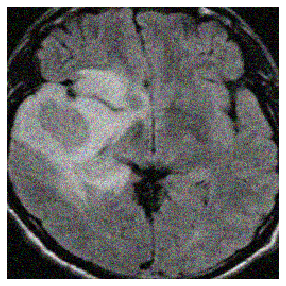

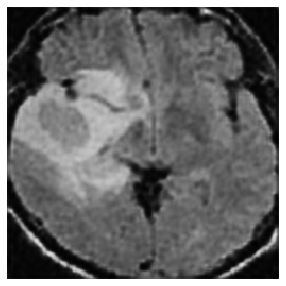

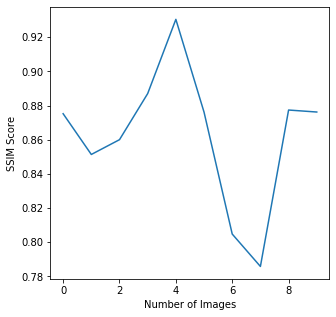

In [13]:
# Plot Original test image
plt.figure(figsize=(5,5))
plt.axis('off')
plt.imshow(X_test[0])

# Plot Noisy test image
plt.figure(figsize=(5,5))
plt.axis('off')
plt.imshow(X_test_noise[0])

# Plotting Denoised Image using AutoEncoder Model
decoded_imgs = auto_encoder.predict(X_test_noisy)
plt.figure(figsize=(5,5))
plt.axis('off')
plt.imshow(decoded_imgs[0])

# Calculating SSIM index for each test image and reconstructed image
# Since the method ssim() does not accepts iterable object and does not works in loop, I tried to calculate ssim for each test image 
from skimage.measure import compare_ssim as ssim 
score_1= ssim(X_test[0], decoded_imgs[0],multichannel=True)
score_2= ssim(X_test[1], decoded_imgs[1],multichannel=True)
score_3= ssim(X_test[2], decoded_imgs[2],multichannel=True)
score_4= ssim(X_test[3], decoded_imgs[3],multichannel=True)
score_5= ssim(X_test[4], decoded_imgs[4],multichannel=True)
score_6= ssim(X_test[5], decoded_imgs[5],multichannel=True)
score_7= ssim(X_test[6], decoded_imgs[6],multichannel=True)
score_8= ssim(X_test[7], decoded_imgs[7],multichannel=True)
score_9= ssim(X_test[8], decoded_imgs[8],multichannel=True)
score_10= ssim(X_test[9], decoded_imgs[9],multichannel=True)
ssim=[]
ssim.append(score_1)
ssim.append(score_2)
ssim.append(score_3)
ssim.append(score_4)
ssim.append(score_5)
ssim.append(score_6)
ssim.append(score_7)
ssim.append(score_8)
ssim.append(score_9)
ssim.append(score_10)

#Plot SSIM Score for all test images
num_img=[i for i in range(len(X_test))]
plt.figure(figsize=(5,5))
plt.plot(num_img,ssim)
plt.xlabel('Number of Images') 
plt.ylabel('SSIM Score') 
plt.show()

In [0]:
!rm -rf /tmp/DAE_Loss 

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 256, 256, 128)     3584      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 128, 128, 128)     0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 64, 64, 128)       147584    
_________________________________________________________________
conv2d_transpose_4 (Conv2DTr (None, 128, 128, 128)     147584    
_________________________________________________________________
up_sampling2d_3 (UpSampling2 (None, 256, 256, 128)     0         
_________________________________________________________________
conv2d_transpose_5 (Conv2DTr (None, 256, 256, 3)       3459

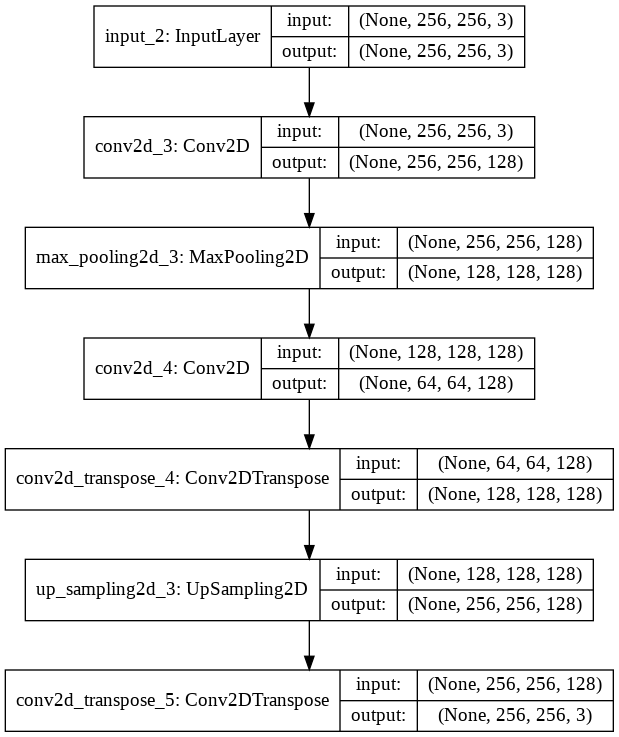

In [15]:
# Denosing AutoEncoder:                                                           
input_img = Input(shape=(256, 256,3))                                            # Input Layer
x = Conv2D(128, (3, 3), activation='relu', padding='same',strides=1)(input_img)  # Convolutional Layer in encoder with 128 filters.
x = MaxPooling2D((2, 2), padding='same')(x)                                      # Maxpooling layer in encoder.
encoded=Conv2D(128, (3, 3), activation='relu', padding='same',strides=2)(x)      # Convolutional layer. Output of Encoder. 

x = Conv2DTranspose(128, (3, 3), activation='relu', padding='same',strides=2)(encoded) # Output of Encoder given as Input to Decoder. Convolutional Transpose Layer in decoder.
x = UpSampling2D((2, 2))(x)                                                      # UpSampling layer in decoder
decoded = Conv2DTranspose(3, (3, 3), activation='sigmoid', padding='same',strides=1)(x)    # Convolutional Transpose layer . Output of Decoder.

denoise_auto_encoder = Model(input_img, decoded)                                 # Defining Denoising AutoEncoder Model
denoise_auto_encoder.compile(optimizer=Adam(), loss='mean_squared_error')        # Compiling Model using Adam optimizer and mean squared error as loss function
denoise_auto_encoder.summary()                                                   # Architecture of Denoising AutoEncoder Model
plot_model(denoise_auto_encoder,show_shapes=True)                                # Plotting graph of Architecture

In [16]:
A2 = TensorBoard(log_dir='/tmp/DAE_Loss',histogram_freq=0,write_graph=True,write_grads=True) # Tensorboard Object
A2.set_model(denoise_auto_encoder)                                               # Setting Model for tensorboard object 'A2'
denoise_auto_encoder.fit(X_train_noisy,x_train,verbose=0,epochs=1000,shuffle=True,callbacks=[A2]) # Fitting or Training Model 

In [17]:
%reload_ext tensorboard                                                          
%tensorboard --logdir /tmp/DAE_Loss                                              

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


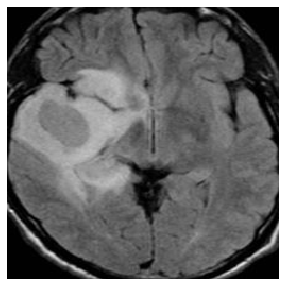

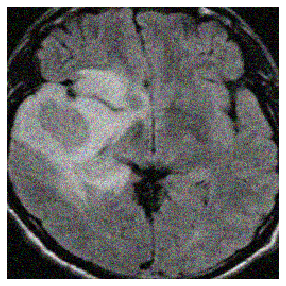

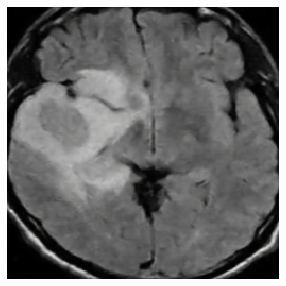

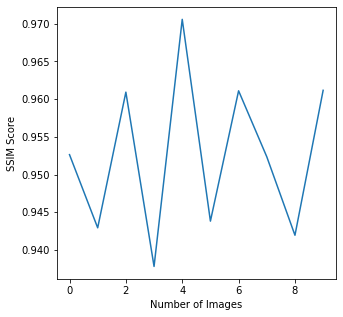

In [18]:
# Plotting Original test image 
plt.figure(figsize=(5,5))
plt.axis('off')
plt.imshow(X_test[0])

# Plotting noisy test image
plt.figure(figsize=(5,5))
plt.axis('off')
plt.imshow(X_test_noise[0])

# Plotting Denoised Image using Denoising AutoEncoder Model 
denoised_imgs = denoise_auto_encoder.predict(X_test_noisy)
plt.figure(figsize=(5,5))
plt.axis('off')
plt.imshow(denoised_imgs[0])

# Calculating SSIM Index for each test image and reconstructed image
# Since the method ssim() does not accepts iterable object and does not works in loop, I tried to calculate ssim for each test image 
from skimage.measure import compare_ssim as ssim 
score_1= ssim(X_test[0], denoised_imgs[0],multichannel=True)
score_2= ssim(X_test[1], denoised_imgs[1],multichannel=True)
score_3= ssim(X_test[2], denoised_imgs[2],multichannel=True)
score_4= ssim(X_test[3], denoised_imgs[3],multichannel=True)
score_5= ssim(X_test[4], denoised_imgs[4],multichannel=True)
score_6= ssim(X_test[5], denoised_imgs[5],multichannel=True)
score_7= ssim(X_test[6], denoised_imgs[6],multichannel=True)
score_8= ssim(X_test[7], denoised_imgs[7],multichannel=True)
score_9= ssim(X_test[8], denoised_imgs[8],multichannel=True)
score_10= ssim(X_test[9], denoised_imgs[9],multichannel=True)
ssim=[]
ssim.append(score_1)
ssim.append(score_2)
ssim.append(score_3)
ssim.append(score_4)
ssim.append(score_5)
ssim.append(score_6)
ssim.append(score_7)
ssim.append(score_8)
ssim.append(score_9)
ssim.append(score_10)

#Plot SSIM Score for all test images
num_img=[i for i in range(len(X_test))]
plt.figure(figsize=(5,5))
plt.plot(num_img,ssim)
plt.xlabel('Number of Images') 
plt.ylabel('SSIM Score') 
plt.show()

In [0]:
!rm -rf /tmp/DAE_RSC_Loss

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
conv2d_9 (Conv2D)               (None, 256, 256, 32) 896         input_4[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_7 (MaxPooling2D)  (None, 128, 128, 32) 0           conv2d_9[0][0]                   
__________________________________________________________________________________________________
conv2d_10 (Conv2D)              (None, 128, 128, 32) 9248        max_pooling2d_7[0][0]            
____________________________________________________________________________________________

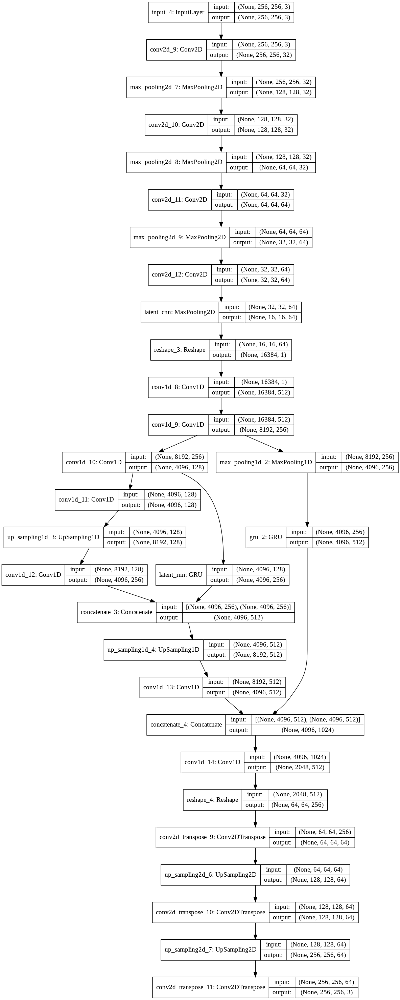

In [22]:
# Denoising Autoencoder with Recurrent Skip Connections:
input_img = Input(shape=(256, 256,3))                                            # Input layer
x = Conv2D(32, (3, 3),strides=1, activation='relu', padding='same')(input_img)   # Convolutional Layer in encoder
x = MaxPooling2D((2, 2), padding='same')(x)                                      # Max Pooling layer in encoder
x = Conv2D(32, (3, 3),strides=1, activation='relu', padding='same')(x)           # Convolutional Layer in encoder
x = MaxPooling2D((2, 2), padding='same')(x)                                      # Max Pooling layer in encoder
x = Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)          # Convolutional Layer in encoder
x = MaxPooling2D((2, 2), padding='same')(x)                                      # Max Pooling layer in encoder
x = Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)          # Convolutional Layer in encoder
encoded = MaxPooling2D((2, 2), padding='same', name = 'latent_cnn')(x)           # Max Pooling layer in encoder. Output of Encoder


shaped=Reshape((16*16*64,1))(encoded)                                            # Reshaping encoded output to give as input to recurrent network

# Recurrent Network with skip connections
recur1 = Conv1D(512,kernel_size=3,strides=1,activation='relu',padding='same')(shaped) #1D Convolutional Layer in encoder
recur2 = Conv1D(256,kernel_size=3,strides=2,activation='relu',padding='same')(recur1)  #1D Convolutional Layer in encoder
recur2_a = MaxPooling1D(2)(recur2)                                                     #1D Max Pooling layer in encoder 

recur3 = Conv1D(128,kernel_size=3,strides=2,activation='relu',padding='same')(recur2) #1D Convolutional layer in encoder
recur4 = Conv1D(128,kernel_size=1,strides=1,activation='relu',padding='same')(recur3) #1D Convolutional layer in encoder

recur4T = UpSampling1D(size=2)(recur4)                                              #1D UpSampling layer in decoder
recur4T = Conv1D(256,kernel_size=3,strides=2,activation='relu',padding='same')(recur4T) #1D Convolutional layer in decoder

# First Skip connection
gru1 = GRU(256,activation='tanh', recurrent_activation='sigmoid',name='latent_rnn',return_sequences=True)(recur3) #GRU layer with input from 1D Convolutional layer
skip_1 = concatenate([recur4T, gru1])                                             # Concatenation of gru and Conv1D layer to create 1st skip connection in autoencoder
 

recur5T = UpSampling1D(size=2)(skip_1)                                            # Output of Skip connection into 1D UpSampling layer
recur5T = Conv1D(512,kernel_size=3,strides=2,activation='relu',padding='same')(recur5T) #1D Convolutional layer in decoder

# Second Skip connection
gru2 = GRU(512,activation='tanh', recurrent_activation='sigmoid',return_sequences=True)(recur2_a) #GRU layer with input from 1D Max Pooling layer
skip_2 = concatenate([recur5T, gru2])                                             # Concatenation of gru and Conv1D layer to create 2nd skip connection in autoencoder

decoded_recur = Conv1D(512,kernel_size=3, strides=2,activation='relu',padding='same')(skip_2) #1D Convolutional layer in decoder
reshaped=Reshape((64,64,256))(decoded_recur)                                            # Reshaping Output of 1D AutoEncoder to construct image for denoising autoencoder

x = Conv2DTranspose(64, (3, 3),strides=1, activation='relu', padding='same')(reshaped) # Output of recurrent network into Decoder of Denoising autoencoder
x = UpSampling2D((2, 2))(x)                                                      # UpSampling layer in decoder
x = Conv2DTranspose(64, (3, 3),strides=1, activation='relu', padding='same')(x)  # Convolutional Transpose layer in decoder
x = UpSampling2D((2, 2))(x)                                                      # UpSampling layer in decoder
decoded = Conv2DTranspose(3, (3, 3),strides=1, activation='sigmoid', padding='same')(x) # Output of decoder

denoise_recur_auto_encoder = Model(input_img, decoded)                           # Defining Denoising Autoencoder with recurrent skip connections model
denoise_recur_auto_encoder.compile(optimizer=Adam(lr=0.001), loss='mean_squared_error')  # Compiling Model using Adam optimizer and mean squared error as loss function
denoise_recur_auto_encoder.summary()                                             # Architecture of Denoising Autoencoder with Recurrent Skip Connections
plot_model(denoise_recur_auto_encoder,show_shapes=True)                          # Plotting graph of Architecture

In [23]:
A1 = TensorBoard(log_dir='/tmp/DAE_RSC_Loss',histogram_freq=0,write_graph=True,write_grads=True) # Tensorboard object
A1.set_model(denoise_recur_auto_encoder)                                                       # Setting Model for tensorboard object 'A1'
denoise_recur_auto_encoder.fit(X_train_noisy,x_train,verbose=0,epochs=400,shuffle=True,callbacks=[A1])

# Since each epoch was taking approx 80s for training, the model has been trained for 400 epochs only. 
# However due to GPU limitations, training of model did not take place for 1000 epochs. It would have given a much better result for 1000 epoch. 

In [24]:
%reload_ext tensorboard                                                          
%tensorboard --logdir /tmp/DAE_RSC_Loss  

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


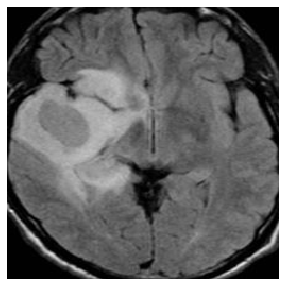

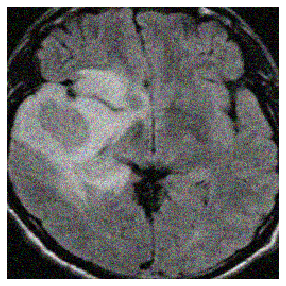

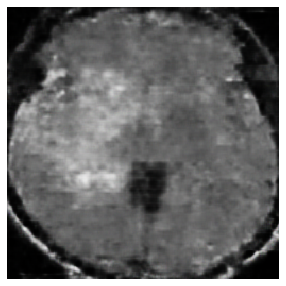

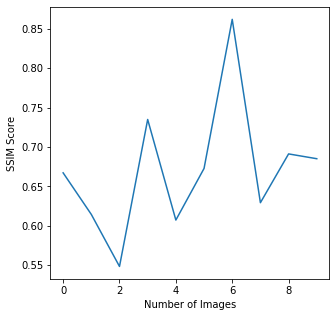

In [25]:
# Plotting Original test Image
plt.figure(figsize=(5,5))
plt.axis('off')
plt.imshow(X_test[0])

# Plotting noisy test image
plt.figure(figsize=(5,5))
plt.axis('off')
plt.imshow(X_test_noise[0])

# Plotting Denoised Image using Denoising Autoencoder with recurrent skip connections
denoised_recur_imgs = denoise_recur_auto_encoder.predict(X_test_noisy)
plt.figure(figsize=(5,5))
plt.axis('off')
plt.imshow(denoised_recur_imgs[0])

# Calculating SSIM Index for each test image and reconstructed image 
# Since the method ssim() does not accepts iterable object and does not works in loop, I tried to calculate ssim for each test image 
from skimage.measure import compare_ssim as ssim 
score_1= ssim(X_test[0], denoised_recur_imgs[0],multichannel=True)
score_2= ssim(X_test[1], denoised_recur_imgs[1],multichannel=True)
score_3= ssim(X_test[2], denoised_recur_imgs[2],multichannel=True)
score_4= ssim(X_test[3], denoised_recur_imgs[3],multichannel=True)
score_5= ssim(X_test[4], denoised_recur_imgs[4],multichannel=True)
score_6= ssim(X_test[5], denoised_recur_imgs[5],multichannel=True)
score_7= ssim(X_test[6], denoised_recur_imgs[6],multichannel=True)
score_8= ssim(X_test[7], denoised_recur_imgs[7],multichannel=True)
score_9= ssim(X_test[8], denoised_recur_imgs[8],multichannel=True)
score_10= ssim(X_test[9], denoised_recur_imgs[9],multichannel=True)
ssim=[]
ssim.append(score_1)
ssim.append(score_2)
ssim.append(score_3)
ssim.append(score_4)
ssim.append(score_5)
ssim.append(score_6)
ssim.append(score_7)
ssim.append(score_8)
ssim.append(score_9)
ssim.append(score_10)

#Plot SSIM Score for all test images
num_img=[i for i in range(len(X_test))]
plt.figure(figsize=(5,5))
plt.plot(num_img,ssim)
plt.xlabel('Number of Images') 
plt.ylabel('SSIM Score') 
plt.show()